# Urban Greenspace and Chronic Obstructive Pulmonary Disease (COPD) Prevalence

### Background
Chronic Obstructive Pulmonary Disease (COPD) is a lung condition characterized by inflammation of the airways, limiting airflow to the lungs. The most common cause of COPD is long-term exposure to irritating smoke, fumes, dust, and chemicals ([Mayo Clinic](https://www.mayoclinic.org/diseases-conditions/copd/symptoms-causes/syc-20353679)).

Because COPD can be caused by environmental exposure, I was curious about the spatial incidence across an urban area like Chicago. Investigating some of the literature relating COPD to greenspace, I found contrasting evidence suggesting there are region-specific relationships between COPD incidence/mortality and greenspace.

One study conducted across Chongqing, China found township-specific relationships between COPD mortality and greenspace. Despite evidence that greenspace can reduce the incidence of lung disease ([Li et al., 2019](https://www.mdpi.com/1660-4601/16/6/991)), this study found that in some regions, COPD related mortality was positive correlated with greenspace ([Gou et al., 2023](link.springer.com/article/10.1186/s12890-023-02359-x#ref-CR10)). Gou et al pointed out that these regions were typically more rural, and thus increased COPD mortality could be due to lack of access to medical treatment rather than as a result of greenspace. 

Another study conducted by [Maas et al., 2009](https://jech.bmj.com/content/63/12/967.short) in the Netherlands show that COPD and asthma (and other indicators of health) are lower in areas with higher greenspace.

Given the highly regional and context specific trends for COPD incidence and greenspace, I was curious to examine their relationship in Chicago.

## STEP 1: Set up analysis

In [12]:
### Import libraries
import os
import pathlib
import sys
import gc

# data types
import pandas as pd
import geopandas as gpd
import xarray as xr
import rioxarray as rxr
import rioxarray.merge as rxrmerge
import shapely
import time
import numpy as np

# plotting
import geoviews as gv
import holoviews as hv
import hvplot.pandas
import hvplot.xarray
from cartopy import crs as ccrs

# data vis
import matplotlib
import matplotlib.pyplot as plt
import scipy.stats as stats

# image processing
from scipy.ndimage import convolve
from scipy.ndimage import label

# cloud data
import pystac_client
#from sodapy import Socrata

# progress bar
from tqdm.notebook import tqdm

# Ordinary least squares (OLS) sklearn
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold


In [13]:
# Needed to ask chat about this
# I could not get a normal pip install sodapy to work and install into the correct conda env
# Needed to specify the sys defauly env using sys.executable

!{sys.executable} -m pip install sodapy
from sodapy import Socrata

In [14]:
### Create reproducible file paths
data_dir = os.path.join(
    # Home dir
    pathlib.Path.home(),
    'Documents',
    # Earth analytics data directory
    'Earth Data Cert',
    'Earth-Analytics-AY25',
    'GitRepos',
    'greenspaces',
    # Project directory
    'spring-01-urban-greenspace-big-data-natshoff',
    # data folder
    'data'
)

os.makedirs(data_dir, exist_ok=True)

print(data_dir)

C:\Users\naho5798\Documents\Earth Data Cert\Earth-Analytics-AY25\GitRepos\greenspaces\spring-01-urban-greenspace-big-data-natshoff\data


In [15]:
### prevent GDAL from quitting due to momentary disruptions
os.environ["GDAL_HTTP_MAX_RETRY"] = "5"
os.environ["GDAL_HTTP_RETRY_DELAY"] = "1"

## STEP 2: Create a site map using Census tract data

In [27]:
### Set up the census tract path
tract_dir = os.path.join(data_dir,'Chicago_tract')
os.makedirs(tract_dir, exist_ok = True)

### Download the census tracts (only once)
tract_path = os.path.join(tract_dir, 'Chicago_tract.shp')

### Load in census tract data
if not os.path.exists(tract_path):
    tract_url = ('https://data.cdc.gov/download/x7zy-2xmx/application%2Fzip')
    tract_gdf = gpd.read_file(tract_url)
    chicago_gpd = tract_gdf[tract_gdf.PlaceName=='Chicago']
    chicago_gpd.to_file(tract_path, index = False)

### check shapefile
chicago_gdf = gpd.read_file(tract_path)


### Site plot -- Census tracts with satellite imagery in the background
(
    # tract gdf
    chicago_gdf

    # Set projection
    .to_crs(ccrs.Mercator())

    # plot with sat imagery in the background
    .hvplot(
        line_color = 'lightgreen', fill_color = None,
        crs = ccrs.Mercator(), tiles = 'EsriImagery',
        frame_width = 600
    )
)


:Overlay
   .WMTS.I     :WMTS   [Longitude,Latitude]
   .Polygons.I :Polygons   [Longitude,Latitude]

**Figure 1:** Census tracts in Chicago, IL.

**Distribution of green space across Chicago**

Green space is not evenly distributed around the city. Looking at the map and thinking about my own time spend in Chicago, urban green space is denser in the eastern part of the city (closer to Lake Michigan) than the western part of the city. It's hard to tell from the map, but I also think there is generally less green space in south Chicago compared to north city. The northeastern part of the city has Lincoln and Montrose park, which are huge green spaces in downtown Chicago. While anecdotally I am aware of the inequality between the southern and norther part of Chicago, I'm curious to know more about how this came about.


**Segregation in Chicago**

It was facinating to learn that the origin of Chicago's 'Black Belt' on the south side of the city was due to second less reported Chicago fire, three years after the famous Great Fire of 1871. This fire recieved less attention but affected Blacks and Jewish people living south of the Loop. The displaced individuals settled south of the fire, establishing the "Black Belt" on Chicago's south side [(Leiter, 2023)](https://www.chicagoreporter.com/chicagos-250-year-history-of-segregation/). Between 1917 and 1930, the black population of Chicago increased fivefold, primairly due to migration drawn by manufacturing jobs to fuel World War I. However, black migrants were limited to the 'Black Belt' portion of the city [(Grossman, 1989)](https://press.uchicago.edu/ucp/books/book/chicago/L/bo3774992.html). The segregation at the root of Chicago's growth has perpetuated inequity in green space dsitribution throughout the city. Several sources have listed redlining, the practice of denying financial services like insurance or loans to specific neighborhoods, as a mjor reason there are fewer green spaces in predominately Black and minority Chicago communities ([Graf, 2019](https://news.medill.northwestern.edu/chicago/friends-of-the-parks-alleges-chicago-green-spaces-still-map-racial-inequality/#:~:text=The%20story%20of%20Chicago%E2%80%99s%20response%20to%20the%20Great%20Migration%E2%80%94when); [William, 2024](https://storymaps.arcgis.com/stories/73179359881c4d8fa8825fcdf4eaa865)).

## STEP 3 - Access COPD and Urban Greenspaces Data

### Step 3a - Downloading 2023 COPD data for Cook county using the [Socrata](https://dev.socrata.com/foundry/data.cdc.gov/cwsq-ngmh) API

In [76]:
### Download COPD data using hte Socrata API

### Set up a path for the copd data
cdc_path = os.path.join(data_dir, 'copd.csv')

# socrata
client = Socrata("data.cdc.gov", None)

# parameters
results = client.get(
    # dataset identifier
    "cwsq-ngmh",
    # COPD params for chicago
    year="2023",
    stateabbr="IL",
    countyname="Cook",
    measureid="COPD",
    limit=1500
)

# convert to a df
cdc_df = pd.DataFrame.from_records(results)

# make the number columns integers
numeric_cols = [
    "data_value",
    "low_confidence_limit",
    "high_confidence_limit",
    "totalpopulation",
    "totalpop18plus",
]

cdc_df[numeric_cols] = cdc_df[numeric_cols].apply(
    pd.to_numeric
)


# rename columns to be more descriptive
cdc_df = cdc_df.rename(columns = {
            'data_value': 'copd',
            'low_confidence_limit': 'copd_ci_low',
            'high_confidence_limit': 'copd_ci_high',
            'locationname': 'tract'
        })

# select columns to keep
cdc_df = cdc_df[[
    'year', 'tract', 'copd', 'copd_ci_low', 'copd_ci_high',
    'data_value_unit', 'totalpopulation', 'totalpop18plus'
    ]]

# Download to a csv
### Download to csv
cdc_df.to_csv(cdc_path, index = False)

### Preview copd data
cdc_df



,year,tract,copd,copd_ci_low,copd_ci_high,data_value_unit,totalpopulation,totalpop18plus
0,2023,17031151002,5.1,4.2,5.9,%,4588,3481
1,2023,17031071600,3.2,2.6,4.0,%,1793,1364
2,2023,17031160601,3.2,2.6,3.8,%,3380,2674
3,2023,17031010502,3.5,2.9,4.2,%,3278,2991
4,2023,17031040300,6.3,5.2,7.6,%,2928,2328
...,...,...,...,...,...,...,...,...
1323,2023,17031834400,5.6,4.6,6.6,%,3765,2903
1324,2023,17031842500,7.4,6.2,8.9,%,2644,1393
1325,2023,17031840400,5.1,4.3,6.0,%,3369,2662
1326,2023,17031834600,11.6,9.8,13.6,%,2357,1812


In [77]:
cdc_df.dtypes

year                object
tract               object
copd               float64
copd_ci_low        float64
copd_ci_high       float64
data_value_unit     object
totalpopulation      int64
totalpop18plus       int64
dtype: object

### Step 3b - Join health data with census tract boundaries

In [79]:
### Change tract identifier datatype for merging
chicago_gdf.tract2010 = chicago_gdf.tract2010.astype('str')

### Merge census data with geometry
tract_cdc_gdf = (
    chicago_gdf
    .merge(cdc_df,
    
        # merge columns
        left_on = 'tract2010',
        right_on = 'tract',

        # use inner join 
        how = 'inner'
        )
)

# check
tract_cdc_gdf

### Plot asthma data as chloropleth

vals=tract_cdc_gdf["copd"]
clim=(float(vals.min()), float(vals.max()))

(
    # Load basemap
    gv.tile_sources.EsriImagery

    * # this is to overlay data

    # map cencus tract data
    gv.Polygons(

        # reporoject
        tract_cdc_gdf.to_crs(ccrs.Mercator()),

        # select columns
        vdims = ['copd', 'tract2010'],

        # ensure crs align
        crs = ccrs.Mercator()
    ).opts(color = 'copd', colorbar = True, clim=clim, tools = ['hover'])

).opts(width = 600, height = 600, xaxis = None, yaxis = None, title = 'COPD Rates Across Chicago Census Tracts (2023)')


:Overlay
   .WMTS.I     :WMTS   [Longitude,Latitude]
   .Polygons.I :Polygons   [Longitude,Latitude]   (copd,tract2010)

**Figure 2:** Distribution of Chronic Obstructive Pulmonary Disease (COPD) across Chicago census tracts.


**Data description**
The CDC PLACES data are modeled estaimates of disease prevalence, in this case at the U.S. cencus tract scale. These data are estimated by small area model and not actual survey data, like a census. These models use statistical relationshios between survey responses and demographic covariates to predict the prevalence of these diseases ([CDC](https://www.cdc.gov/places/methodology/index.html)).

**Data Source Citation**
Centers for Disease Control and Prevention. (2025). *PLACES: Local Data for Better Health, Census Tract Data* [Dataset]. CDC Data Portal. Retrieved January 26, 2026, from https://data.cdc.gov/500-Cities-Places/PLACES-Local-Data-for-Better-Health-Census-Tract-D/cwsq-ngmh


**Distribution of COPD in Chicago**
COPD, like asthma, appears to be more prevalend in southern and western census tracts. This matches where green space density appears to be lacking, and where higher proportions of Black Chicagoans live.

### Step 3c - Get data URLs for urban greenspace imagery


In [80]:
### Connect to the planetary computer catalog
e84_catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1"
)


In [81]:
# Define NDVI path
ndvi_stats_path = os.path.join(data_dir, 'chicago-ndvi-stats.csv')

# check if NDVI path exists
if os.path.exists(ndvi_stats_path):
    print("NDVI URLs already exist")
    scene_df = pd.read_csv(ndvi_stats_path)

else:
    print("NAIP STAC Query")


if not os.path.exists(ndvi_stats_path):

    ### convert geometry to lat/long
    tract_latlong_gdf = tract_cdc_gdf.to_crs(4326)

    ### empty list for census tract ids
    downloaded_tracts = []

    ### list to add into
    scene_dfs = []

    ### loop through each tract
    for i, tract_values in tqdm(tract_latlong_gdf.iterrows()):

        tract = tract_values.tract2010

        ### retry logic
        retry = 0
        retry_limit = 5

        while retry < retry_limit:
            try:
                naip_search = e84_catalog.search(
                    collections=['naip'],
                    intersects=shapely.to_geojson(tract_values.geometry),
                    datetime='2021'
                )

                scene_dfs.append(
                    pd.DataFrame({
                        'tract': tract,
                        'date': [
                            pd.to_datetime(scene.datetime).date()
                            for scene in naip_search.items()
                        ],
                        'rgbir_href': [
                            scene.assets['image'].href
                            for scene in naip_search.items()
                        ]
                    })
                )

                break  # success → exit retry loop

            except pystac_client.exceptions.APIError:
                print(f"STAC error for tract {tract}, retrying...")
                time.sleep(2)
                retry += 1

    ### concatenate and save
    if scene_dfs:
        scene_df = pd.concat(scene_dfs).reset_index(drop=True)
        scene_df.to_csv(ndvi_stats_path, index=False)
    else:
        scene_df = None


NDVI URLs already exist


In [82]:
### write out to scene_df as a csv
scene_df.to_csv(ndvi_stats_path, index=False)

### Step 3d- Compute NDVI Statistics

Next, we calculate some metrics to get at different aspects of the
distribution of greenspace in each census tract. These types of
statistics are called **fragmentation statistics**, and can be
implemented with the `scipy` package.

*Percentage vegetation*: The percentage of pixels that exceed a vegetation threshold (.12 is
common with Landsat) Mean patch size

*Mean patch size*: The average size of **patches**, or contiguous area exceeding the
vegetation threshold. Patches can be identified with the `label`
function from `scipy.ndimage` 

*Edge density*: The proportion of edge pixels among vegetated pixels. Edges can be
identified by **convolving** the image with a **kernel** designed to
detect pixels that are different from their surroundings.

In [83]:
### Ensure tract IDs are strings and not integers
chicago_gdf["tract2010"] = chicago_gdf["tract2010"].astype(str)
cdc_df["tract"] = cdc_df["tract"].astype(str)

In [84]:
### make csv for ndvi data
ndvi_stats_path_veg = os.path.join(data_dir, 'chicago-ndvi-stats-veg-test.csv')

In [85]:
### For loop for computing veg stats for each tract

# check if data already exists 
if os.path.exists(ndvi_stats_path_veg):
    ndvi_stats_df = pd.read_csv(ndvi_stats_path_veg)

else:

    # for loop for assignment code
    for tract, tract_date_gdf in tqdm(scene_df.groupby("tract")):
        tract = str(tract).zfill(11)

        # list for storing NDVI arrays
        tile_das = []

        # iterate over rows in tract dataframe
        for _, href_s in tract_date_gdf.iterrows():
            
            ### Open GDAL connection to data
            tile_da = rxr.open_rasterio(href_s.rgbir_href, masked=True).squeeze()

            ### Clip data
            boundary = (
                tract_cdc_gdf
                .set_index("tract2010")
                .loc[[tract]]
                .to_crs(tile_da.rio.crs)
                .geometry
            )

            ### crop to bounding box
            crop_da = tile_da.rio.clip_box(*boundary.envelope.total_bounds, auto_expand=True)
            
            ### clip to actual tract geometry
            clip_da = crop_da.rio.clip(boundary, all_touched=True)

            ### Compute NDVI
            ndvi_da = (
                (clip_da.sel(band=4) - clip_da.sel(band=1)) /
                (clip_da.sel(band=4) + clip_da.sel(band=1))
            )

            ### Accumulate result
            tile_das.append(ndvi_da)

        ### Merge data
        scene_da = rxrmerge.merge_arrays(tile_das)

        ### Mask vegetation
        veg_mask = (scene_da > 0.3)

        ### Calculate statistics and save data to file
        # valid pixles
        total_pixels = int(scene_da.notnull().sum().values)
        
        # vegetated pixels
        veg_pixels = int(veg_mask.sum().values)

        ### label veg patches
        labeled_patches, num_patches = label(veg_mask.values)
        
        ### mean patch size
        patch_sizes = np.bincount(labeled_patches.ravel())[1:]
        mean_patch_size = float(patch_sizes.mean()) if len(patch_sizes) else 0.0

        ### Make kernel to calculate edge density
        kernel = np.array([[1,1,1],[1,-8,1],[1,1,1]])
        
        ### Calculate edge density
        edges = convolve(veg_mask.values.astype(int), kernel, mode="constant")
        edge_density = float(np.sum(edges != 0) / veg_mask.size)


        ### Add a row to the statistics file for this tract
        ### create new df for tract
        pd.DataFrame({
            "tract": [tract],
            "total_pixels": [total_pixels],
            "frac_veg": [veg_pixels / total_pixels if total_pixels else np.nan],
            "mean_patch_size": [mean_patch_size],
            "edge_density": [edge_density],
        # write out as csv and save 
        }).to_csv(
            ndvi_stats_path_veg,
            mode="a",
            index=False,
            header=(not os.path.exists(ndvi_stats_path_veg)),
        )

    # reload at end
    ndvi_stats_df = pd.read_csv(ndvi_stats_path_veg)


In [86]:
ndvi_stats_df = pd.read_csv(ndvi_stats_path_veg)
ndvi_stats_df

,tract,total_pixels,frac_veg,mean_patch_size,edge_density
0,17031010100,1059033,0.178657,55.225919,0.118612
1,17031010201,1531554,0.213859,57.543394,0.161668
2,17031010202,978546,0.186055,63.260250,0.123673
3,17031010300,1308392,0.191675,57.113642,0.126384
4,17031010400,1516964,0.198563,52.983817,0.079474
...,...,...,...,...,...
783,17031843500,5647650,0.075254,9.732779,0.104686
784,17031843600,1142916,0.054393,9.177296,0.101217
785,17031843700,6025768,0.027644,7.477533,0.047642
786,17031843800,3639014,0.093920,24.169295,0.105052


## STEP 4 - Explore data with plots

In [87]:
### Ensure tract is a string so join works
ndvi_stats_df["tract"] = ndvi_stats_df["tract"].astype(str)

### Merge census data with geometry
chi_ndvi_cdc_gdf = (

    # census tract gdf
    tract_cdc_gdf

    # merge with ndvi df
    .merge(
        ndvi_stats_df,

        # match on tract ID
        left_on = 'tract2010',
        right_on = 'tract',
        how = 'inner'
    )
)

# check on data structure
chi_ndvi_cdc_gdf

,place2010,tract2010,ST,PlaceName,plctract10,PlcTrPop10,geometry,year,tract_x,copd,copd_ci_low,copd_ci_high,data_value_unit,totalpopulation,totalpop18plus,tract_y,total_pixels,frac_veg,mean_patch_size,edge_density
0,1714000,17031010100,17,Chicago,1714000-17031010100,4854,"POLYGON ((-9758835.381 5164429.383, -9758837.3...",2023,17031010100,6.4,5.4,7.4,%,4905,4083,17031010100,1059033,0.178657,55.225919,0.118612
1,1714000,17031010201,17,Chicago,1714000-17031010201,6450,"POLYGON ((-9760143.496 5163888.741, -9760143.4...",2023,17031010201,7.3,6.4,8.2,%,6939,5333,17031010201,1531554,0.213859,57.543394,0.161668
2,1714000,17031010202,17,Chicago,1714000-17031010202,2818,"POLYGON ((-9759754.212 5163883.196, -9759726.6...",2023,17031010202,6.3,5.2,7.3,%,2742,2296,17031010202,978546,0.186055,63.260250,0.123673
3,1714000,17031010300,17,Chicago,1714000-17031010300,6236,"POLYGON ((-9758695.229 5163870.91, -9758695.78...",2023,17031010300,5.8,4.9,6.9,%,6305,5606,17031010300,1308392,0.191675,57.113642,0.126384
4,1714000,17031010400,17,Chicago,1714000-17031010400,5042,"POLYGON ((-9757724.634 5160715.939, -9757742.2...",2023,17031010400,4.4,3.8,5.1,%,5079,4742,17031010400,1516964,0.198563,52.983817,0.079474
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
783,1714000,17031770700,17,Chicago,1714000-17031770700,0,"POLYGON ((-9780753.304 5157066.079, -9780752.0...",2023,17031770700,7.1,5.9,8.2,%,2537,2093,17031770700,5547730,0.022761,7.584359,0.020706
784,1714000,17031770800,17,Chicago,1714000-17031770800,0,"POLYGON ((-9783235.84 5154620.343, -9783211.23...",2023,17031770800,5.9,4.9,7.0,%,5661,4457,17031770800,174812,0.138652,6.197392,0.172915
785,1714000,17031805600,17,Chicago,1714000-17031805600,0,"POLYGON ((-9776210.02 5161605.738, -9776213.47...",2023,17031805600,3.8,3.0,4.8,%,4710,3420,17031805600,463,0.000000,NaN,0.000000
786,1714000,17031807900,17,Chicago,1714000-17031807900,0,"POLYGON ((-9768609.902 5160576.634, -9768654.5...",2023,17031807900,5.3,4.2,6.6,%,4201,3396,17031807900,26883,0.079121,23.898876,0.101617


In [88]:
### Plot chloropleths with vegetation statistics

# make a function for plotting chloropeths
def plot_chloropleth(gdf, **opts):

    ### docstring to describe function
    """Generate a chloropleth with the given color column"""

    ### use geoviews to make a polygon object
    return gv.Polygons(

        # mercator crs
        gdf.to_crs(ccrs.Mercator()),

        ### set plot crs to mercator
        crs = ccrs.Mercator()

    ### drop x and y axis and add a legend
    ).opts(xaxis = None, yaxis = None, colorbar = True, **opts)

In [89]:
### apply function to chicago data
(
    # plot asthma by cencus tract
    plot_chloropleth(
        chi_ndvi_cdc_gdf, color = 'copd', cmap = 'viridis', title = 'Adult COPD Rate', clabel = 'COPD Rate (%)', tools = ['hover']
    )

    +
    
    # vegetation edge density
    plot_chloropleth(
        chi_ndvi_cdc_gdf, color = 'edge_density', cmap = 'Greens', title = "Vegetation Density", clabel = 'Vegetation Edge Density', tools = ['hover']
    )
)

:Layout
   .Polygons.I  :Polygons   [Longitude,Latitude]   (place2010,tract2010,ST,PlaceName,plctract10,PlcTrPop10,year,tract_x,copd,copd_ci_low,copd_ci_high,data_value_unit,totalpopulation,totalpop18plus,tract_y,total_pixels,frac_veg,mean_patch_size,edge_density)
   .Polygons.II :Polygons   [Longitude,Latitude]   (place2010,tract2010,ST,PlaceName,plctract10,PlcTrPop10,year,tract_x,copd,copd_ci_low,copd_ci_high,data_value_unit,totalpopulation,totalpop18plus,tract_y,total_pixels,frac_veg,mean_patch_size,edge_density)

**Figure 3:** Comparison between adult COPD rate and vegetation edge density across Chicago census tracts.

**Similarities between plots**
Similar the asthma figures, we see higher incidence of COPD in the western and southern parts of the city. Again, this doesn't seem exactly correlated with vegetation density and we could be missing some underlying data like income or insurance status.


## STEP 5: Explore a linear ordinary least-squares regression

**Model Assumptions**
Linear ordinary least-squares regression has five major assumptions. (1) There is a linear relationship between the predictor and response variable. (2) Residuals (observed values - model predicted value) are normally distrubuted and homoscedastic (hvaing constant variance). (3) Independence of predictor variables. For example, we need to verify that population density is not correlated with per capita income. (4) The model parameters will not vary over time (i.e. one model can be used for an entire time series). (5) There are no 'no data' values or NAs.

**Objective of the Model**
The objective of this model is to evaluate the relationship between fractional NDVI and asthma rates. One way to evaluate this is to use the R^2 value which indicates the percent variation in the response variable (asthma in this case) is explained by the model. Thus a high R^2 means our model explains much of the variation in asthma rates which allows us to draw more robust conclusions about the factors influencing asmtha. We could also cross-validate our model using training and testing data. The model would be trained on the training data and evaluated using the test data. 

**Advantages and issues with this model**
One advantage of this model is to avoid overfitting. We are avoiding a model like a local polynomial regression which minimizes error across the data, but has less power to reveal the impact of predictors on the response data. We could have issues using a linear model if there are modulating factors between asthma and NDVI that make the relationship non-linear. For example, in class we discussed how NDVI and median income can be non-linear, depending on the location. High median income facilitates better medical care, which may reduce asthma incidence independent of urban green space access. 

### Step 5a - Data preparation
- Remove NAs
- Assess highly correlated variables and select inputs
- Transform skewed data

In [ ]:
### Assumption check: missing values in variable columns
### We'll drop this later when we create the model dataframe
chi_ndvi_cdc_gdf.isna().any().sum()

np.int64(1)

In [92]:
### Assumption check: missing values in rows
chi_ndvi_cdc_gdf.isna().any(axis = 1)

0      False
1      False
2      False
3      False
4      False
       ...  
783    False
784    False
785     True
786    False
787    False
Length: 788, dtype: bool

In [101]:
### Visualize distribution of data - correlation matrix

# select variables
variables = ['frac_veg', 'copd', 'mean_patch_size', 'edge_density']

# scatterplot
hvplot.scatter_matrix(

    chi_ndvi_cdc_gdf[variables]
)

:GridMatrix   [X,Y]
   :Histogram   [mean_patch_size]   (Count)

**Figure 4:** Correlation matrix between vegetation predictor variables (edge density, fraction of vegetation, and mean patch size) and the response, copd rate.

### Quick correlation / distribution thoughts

Highly correlated metrics
- Fraction of vegetation and edge density are highly correlated
- Fraction of vegetation and mean patch size are correlated

Distributions
- Everything is right skewed

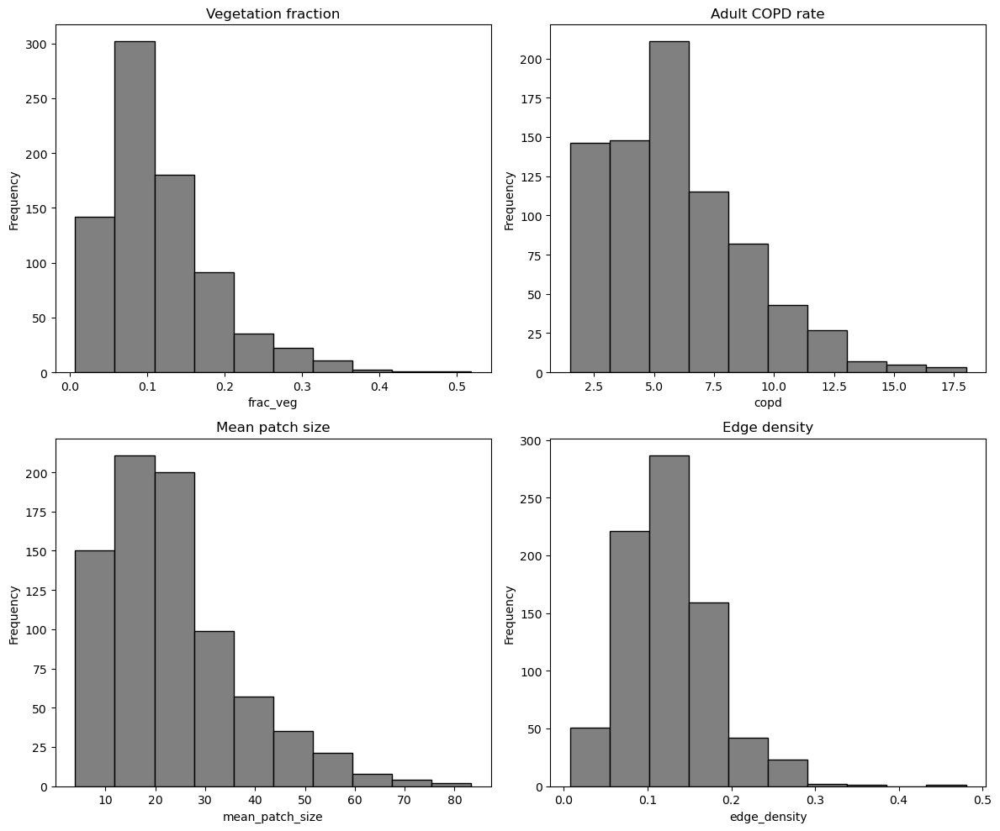

In [98]:
### Histrogram facet

# make plot
fig, axes = plt.subplots(2,2, figsize = (12, 10))

# variables in the plot
variables = ['frac_veg', 'copd', 'mean_patch_size', 'edge_density']
titles = ['Vegetation fraction', 'Adult COPD rate', 'Mean patch size', 'Edge density']

# loop through the variables
for i, (var, title) in enumerate(zip(variables, titles)):
    ax = axes[i//2, i%2]
    ax.hist(chi_ndvi_cdc_gdf[var], bins = 10, color = 'grey', edgecolor = 'black')
    ax.set_title(title)
    ax.set_xlabel(var)
    ax.set_ylabel('Frequency')

# adjust for overlap
plt.tight_layout()
plt.show()

**Figure 5:** Histograms of vegetation and copd variables.

In [100]:
### Remove missing data
model_df = (
    chi_ndvi_cdc_gdf

    # copy
    .copy()

    # subset to columns
    [['frac_veg', 'copd', 'mean_patch_size', 'edge_density', 'geometry']]

    # drop rows with missing data
    .dropna()

)

model_df

,frac_veg,copd,mean_patch_size,edge_density,geometry
0,0.178657,6.4,55.225919,0.118612,"POLYGON ((-9758835.381 5164429.383, -9758837.3..."
1,0.213859,7.3,57.543394,0.161668,"POLYGON ((-9760143.496 5163888.741, -9760143.4..."
2,0.186055,6.3,63.260250,0.123673,"POLYGON ((-9759754.212 5163883.196, -9759726.6..."
3,0.191675,5.8,57.113642,0.126384,"POLYGON ((-9758695.229 5163870.91, -9758695.78..."
4,0.198563,4.4,52.983817,0.079474,"POLYGON ((-9757724.634 5160715.939, -9757742.2..."
...,...,...,...,...,...
782,0.020053,6.6,13.674242,0.029123,"MULTIPOLYGON (((-9787333.178 5161561.245, -978..."
783,0.022761,7.1,7.584359,0.020706,"POLYGON ((-9780753.304 5157066.079, -9780752.0..."
784,0.138652,5.9,6.197392,0.172915,"POLYGON ((-9783235.84 5154620.343, -9783211.23..."
786,0.079121,5.3,23.898876,0.101617,"POLYGON ((-9768609.902 5160576.634, -9768654.5..."


In [117]:
### Perform variable transformation

# log of copd rate
model_df['log_copd'] = np.log(model_df.copd)

# log of patch size
model_df['log_mean_patch_size'] = np.log(model_df.mean_patch_size)

# log of fractional vegetation
model_df['log_frac_veg'] = np.log(model_df.frac_veg)

# log of edge density vegetation
# opted to not use this - qq plot looked worse for the log transformed data
model_df['log_edge_density'] = np.log(model_df.edge_density)

In [118]:
### Visualize transformed variables - correlation matrix

# select variables
variables = ['log_frac_veg', 'log_copd', 'log_mean_patch_size', 'edge_density', 'log_edge_density']

# scatterplot
hvplot.scatter_matrix(

    model_df[variables]
)


:GridMatrix   [X,Y]
   :Histogram   [log_mean_patch_size]   (Count)

**Figure 6:** Correlation matrix of log-transformed variables.

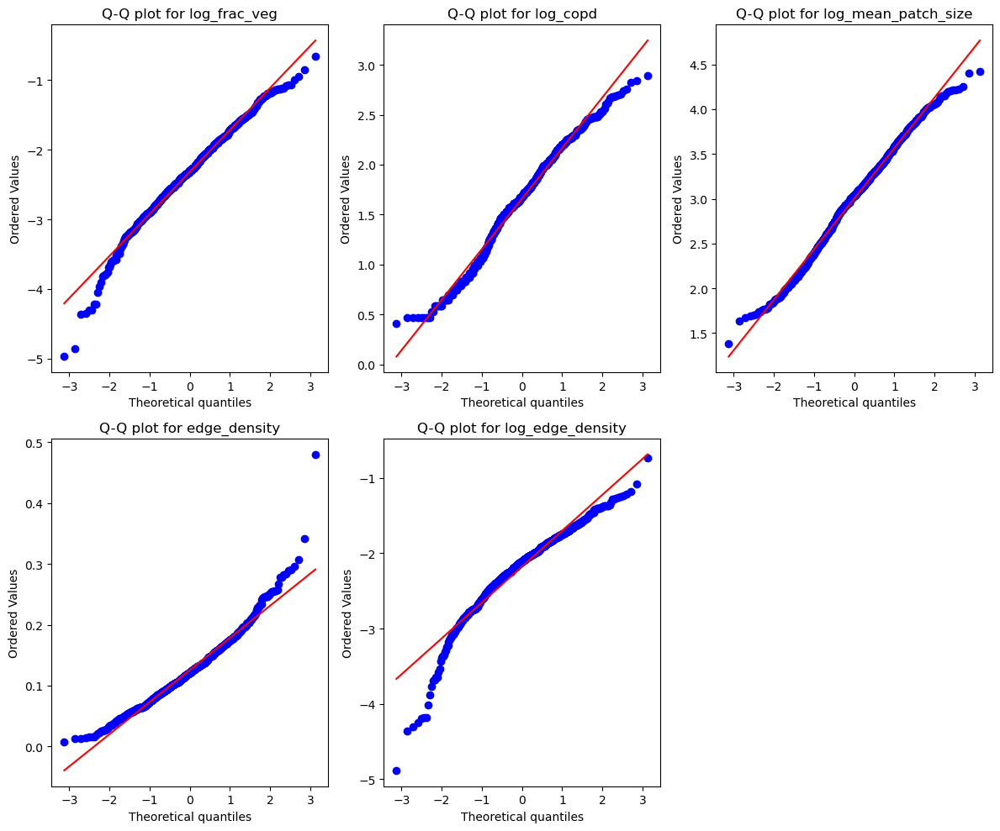

In [ ]:
### q-q plot visualization

# set variables
var_qq =  ['log_frac_veg', 'log_copd', 'log_mean_patch_size', 'edge_density', 'log_edge_density']

# make qq plot for each var
plt.figure(figsize = (12, 10))
for i, var in enumerate(var_qq, 1):

    # make facet
    plt.subplot(2, 3, i)

    # norm distribution
    stats.probplot(model_df[var], dist = "norm", plot = plt)

    # add title
    plt.title(f'Q-Q plot for {var}')

# plot
plt.tight_layout()
plt.show()


**Figure 7:** Quantile-Quantile (Q-Q) plot showing the distribution of log-transformed variables.

**Data Selection**
I chose edge density and mean patch size as explanatory variables because they are less correlated with each other than some of the other vegetation characteristics. I also am curious about the impact of vegetation density and greenspace size on health statistics. I would predict higher vegetation density and patch size would lead to lower rates of COPD.

**Transformation**
I removed NA values (cannot be modeled) and performed a log transformation on copd rate and mean patch size since they were right skewed. I opted to not log-transform edge density even though there are couple outlier values that make the data slight right skewed. However, plotting log-transformed edge_density on the q-q plot clearly shows the log-transformed distribution is even less normal than the untransformed version.

### Step 5b - Fit and Predict

In [114]:
### Select predictor and outcome variables
X = model_df[['edge_density', 'log_mean_patch_size']]
y = model_df[['log_copd']]

### Split into training and testing datasets
X_train, X_test, y_train, y_test = train_test_split(

    X, y, test_size = 0.3, random_state=19
)

### Fit a linear regression
reg = LinearRegression()

### fir to data
reg.fit(X_train, y_train)

### Predict copd values for the test dataset
y_test['pred_copd'] = np.exp(reg.predict(X_test))

### real copd data for comparison
y_test['copd'] = np.exp(y_test.log_copd)

# view
y_test

,log_copd,pred_copd,copd
295,0.916291,3.888222,2.5
549,2.292535,6.972938,9.9
595,2.476538,6.980736,11.9
378,0.875469,5.109674,2.4
16,2.104134,6.124937,8.2
...,...,...,...
197,1.360977,6.437381,3.9
590,2.821379,6.773180,16.8
359,2.251292,6.017374,9.5
392,2.631889,4.474853,13.9


In [115]:
### Plot measured vs. predicted copd prevalence with a 1-to-1 line

# set y axis scale to largest copd value
y_max = y_test.copd.max()

(
    y_test
    .hvplot.scatter(x='copd', 
                    y='pred_copd',
                    xlabel = "Measured adult copd prevalence",
                    ylabel = "Predicted adult copd prevalence",
                    title = "Linear regression performace - testing data")
    .opts(aspect='equal', 
          xlim=(0, y_max), ylim=(0, y_max), 
          width=600, height=600)
) * hv.Slope(slope=1, y_intercept=0).opts(color='black')

:Overlay
   .Scatter.I    :Scatter   [copd]   (pred_copd)
   .Annotation.I :Slope   [x,y]

**Figure 8:** Predicted vs. measured COPD prevalence using our OLS model.

**Model interpretation**
Our model and the vegetation predictors (edge density and patch size) do a poor job predicting COPD rates across the city. A strong model would show a linear relationship between measured and predicted COPD prevalence. 

### Step 5c - Explore spatial bias

In [116]:
### Compute model error for all census tracts

# use the trained model to predict asthma prevalence for each census tract
model_df['pred_copd'] = np.exp(reg.predict(X))

# calculate model error
model_df['error_copd'] = model_df['pred_copd'] - model_df['copd']

### Plot error geographically as a chloropleth
(
    plot_chloropleth(model_df, color = "error_copd", cmap = "RdBu", title = "Spatial Distribution of COPD Prediction Error")

    # set frame width
    .opts(frame_width = 600, aspect = 'equal', clabel = 'Prediction Error (%)',)

)


:Polygons   [Longitude,Latitude]   (frac_veg,copd,mean_patch_size,edge_density,log_copd,log_mean_patch_size,log_frac_veg,log_edge_density,pred_copd,error_copd)

**Figure 9:** Spatial distribution of model prediction error across the Chicago transects.

**Spatial distribution of error**
Just like in our Asthma model, we underestimate COPD rates in south and western areas of the city, and over estimates in the northern and central parts. This pattern mirrors the spatial distribution of COPD rates in the city, seen in our map plotting the raw PLACES data on the city. 

**How to improve these results**
It seem that our model has some degree of spatial autocorrelation that we aren't accounting for. We could start by adding latitude and longitude as predictor variables as a way of explaining some of the variation we're seeing. If these issues persist, we could pivot to a model like geographically weighted regression, which can help account for the non-stationarity we're seeing in our data [(Columbia, Mailman School of Public Health)](https://www.publichealth.columbia.edu/research/population-health-methods/geographically-weighted-regression).